In [1]:
# initial setup
try:
    # settings colab:
    import google.colab
        
except ModuleNotFoundError:    
    # settings local:
    %run "common/0_notebooks_base_setup.py"

default checking
Running command `conda list`... ok
jupyterlab=1.2.6 already installed
pandas=1.0.3 already installed
matplotlib=2.2.2 already installed
bokeh=2.0.0 already installed
seaborn=0.10.0 already installed
ipywidgets=7.5.1 already installed
pytest=5.3.4 already installed
chardet=3.0.4 already installed
psutil=5.7.0 already installed
scipy=1.4.1 already installed
statsmodels=0.11.0 already installed
scikit-learn=0.22.1 already installed
xlrd=1.2.0 already installed
plotly=4.6.0 already installed
chart-studio=1.1.0 already installed
plotly-orca=1.3.1 already installed
Running command `conda install --yes unicodedata2`... ok
Solving environment: ...working... done

# All requested packages already installed.


Importando librerías ...
Las librerías has sido importadas con éxito


In [2]:
import pandas as pd

In [3]:
import numpy as np

In [4]:
# LECTURA DEL ARCHIVO DE DATOS
data_clean = pd.read_csv("CleanCSV/Clean07_Final.csv")

In [5]:
# SÓLO PARA USO EN COMPARACIONES
data_clean_ORIGINAL = data_clean.copy(deep=True) 

In [6]:
data_clean.head(3)

,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
0,0,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
1,1,Argentina,Buenos Aires,Zona Sur,La Plata,La Plata,La Plata,sell,apartment,3432039.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
2,2,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


In [7]:
data_clean.columns

Index(['Unnamed: 0', 'País', 'Provincia', 'Área', 'Localidad', 'Zona', 'Lugar', 'operation', 'property_type', 'geonames_id', 'lat', 'lon', 'price_aprox_usd', 'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2', 'floor', 'rooms', 'expenses', 'description', 'url_clean', 'url_terraza', 'url_quincho', 'desc_terraza', 'desc_quincho', 'garage', 'lavadero', 'balcon', 'parrilla', 'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte', 'baulera', 'piscina_house', 'piscina_depart', 'desc_banios', 'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH', 'tipo_propiedad_apartment', 'tipo_propiedad_house', 'tipo_propiedad_store'], dtype='object')

<hr id="Ubicaciones">

#### AGRUPANDO y DETECTANDO OUTLIERS (por RANGO INTERCUARTIL) en "price_usd_per_m2" y "price_aprox_usd"

In [8]:
# PRUEBA PARA ENTENDER CÓMO DEVUELVE LOS FRAME LA ITERACIÓN SOBRE EL GROUPBY 
# LOS VOY A AGRUPAR POR LOCALIDAD y POR TIPO DE PROPIEDAD PARA ELEIMINAR OUTLIERS

grupos_x_localidad = data_clean.loc[(data_clean["Área"] == "Capital Federal")].groupby(["Localidad", "property_type"])
for localidad, frame in grupos_x_localidad:
    display(frame)

,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5354,5354,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
5357,5357,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
7685,7685,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,1.0,0.0,0,0,NaN,0,1,0,0,0
8874,8874,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,1.0,0.0,0,0,NaN,0,1,0,0,0
26888,26888,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,0.0,0.0,0,0,NaN,0,1,0,0,0
27161,27161,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
30229,30229,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
30238,30238,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
31430,31430,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,1.0,0.0,0,0,2.0,0,1,0,0,0
34610,34610,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,PH,NaN,...,1.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
791,791,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
5356,5356,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5395,5395,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5493,5493,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,0.0,0.0,0,0,NaN,0,0,1,0,0
12842,12842,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
17996,17996,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,1.0,1.0,0,0,1.0,0,0,1,0,0
19603,19603,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
19604,19604,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
20373,20373,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
20634,20634,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,apartment,NaN,...,1.0,0.0,0,1,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
9055,9055,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,1.0,0.0,0,0,5.0,0,0,0,1,0
56062,56062,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
56063,56063,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
56064,56064,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
56065,56065,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
56066,56066,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
56067,56067,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
56068,56068,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
56069,56069,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
67149,67149,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,house,NaN,...,0.0,0.0,1,0,2.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
31188,31188,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
45919,45919,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
52060,52060,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,1.0,0.0,0,0,1.0,0,0,0,0,1
57895,57895,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,1.0,0.0,0,0,2.0,0,0,0,0,1
58101,58101,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
61009,61009,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,1.0,0.0,0,0,1.0,0,0,0,0,1
81090,81090,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,0.0,0.0,0,0,1.0,0,0,0,0,1
84589,84589,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
100644,100644,Argentina,Capital Federal,Capital Federal,Abasto,Abasto,Abasto,sell,store,NaN,...,1.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8218,8218,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
8467,8467,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
45268,45268,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,0.0,0.0,0,0,3.0,0,1,0,0,0
47096,47096,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
53702,53702,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
62777,62777,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
119376,119376,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,PH,3436487.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
382,382,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,1.0,0,1,1.0,0,0,1,0,0
5826,5826,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
5994,5994,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
12393,12393,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
29712,29712,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,1.0,0,0,NaN,0,0,1,0,0
30976,30976,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
33218,33218,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
40073,40073,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
41141,41141,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
41312,41312,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,apartment,3436487.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
2037,2037,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,house,3436487.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
49702,49702,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,house,3436487.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
62783,62783,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,house,3436487.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
98674,98674,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,house,3436487.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
82667,82667,Argentina,Capital Federal,Capital Federal,Agronomía,Agronomía,Agronomía,sell,store,3436487.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
231,231,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
728,728,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
729,729,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
730,730,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
1014,1014,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
4317,4317,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
5353,5353,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
5358,5358,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
5398,5398,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
7166,7166,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,PH,3436397.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
98,98,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0
388,388,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,1.0,1.0,0,0,3.0,0,0,1,0,0
405,405,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
656,656,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
742,742,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,1.0,1.0,0,0,2.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120802,120802,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0
120881,120881,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0
120882,120882,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0
120883,120883,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,apartment,3436397.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1747,1747,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
2532,2532,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
3339,3339,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
3922,3922,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
4223,4223,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
5397,5397,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
6431,6431,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,1,0,1.0,0,0,0,1,0
6751,6751,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
7129,7129,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
9557,9557,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,house,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
10070,10070,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
10795,10795,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
12738,12738,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
12739,12739,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
18583,18583,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
23419,23419,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
30598,30598,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
31414,31414,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
32073,32073,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
37884,37884,Argentina,Capital Federal,Capital Federal,Almagro,Almagro,Almagro,sell,store,3436397.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
734,734,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
735,735,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
736,736,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
4770,4770,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
9044,9044,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
9101,9101,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
11458,11458,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,0.0,0,1,NaN,0,1,0,0,0
16036,16036,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
20272,20272,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
20637,20637,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,PH,6693228.0,...,1.0,0.0,0,0,3.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
48,48,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
157,157,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
167,167,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
720,720,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
737,737,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,1.0,1.0,0,0,2.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119968,119968,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
119969,119969,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
119970,119970,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
120736,120736,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,apartment,6693228.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
3716,3716,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
13635,13635,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
16237,16237,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
33339,33339,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0
37798,37798,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
44169,44169,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,0.0,1,0,NaN,0,0,0,1,0
44862,44862,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
45163,45163,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,0.0,0,0,3.0,0,0,0,1,0
80982,80982,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
114356,114356,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,house,6693228.0,...,1.0,1.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
10347,10347,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
12297,12297,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
12714,12714,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
19726,19726,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
28067,28067,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
30685,30685,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
31378,31378,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
32973,32973,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
33639,33639,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
36174,36174,Argentina,Capital Federal,Capital Federal,Balvanera,Balvanera,Balvanera,sell,store,6693228.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
79016,79016,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,Fondo de Comercio,3436134.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0
121073,121073,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,Fondo de Comercio,3436134.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
187,187,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
4866,4866,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
4873,4873,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,1.0,0,0,NaN,0,1,0,0,0
4882,4882,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,1.0,0,0,NaN,0,1,0,0,0
4901,4901,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
4902,4902,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
4906,4906,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
10495,10495,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,0.0,0,0,3.0,0,1,0,0,0
10496,10496,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
10499,10499,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,PH,3436134.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
341,341,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
640,640,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
1094,1094,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
1097,1097,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
1119,1119,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118193,118193,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
118194,118194,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
118195,118195,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
118196,118196,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,apartment,3436134.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1722,1722,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
1723,1723,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
4843,4843,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
4845,4845,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
4862,4862,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
4863,4863,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
4883,4883,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
4885,4885,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,0,0,3.0,0,0,0,1,0
4916,4916,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
7171,7171,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,house,3436134.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4839,4839,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
4858,4858,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
10105,10105,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
11071,11071,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
32394,32394,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
60958,60958,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
80378,80378,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,0.0,0.0,0,0,3.0,0,0,0,0,1
84897,84897,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
85349,85349,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
95225,95225,Argentina,Capital Federal,Capital Federal,Barracas,Barracas,Barracas,sell,store,3436134.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
31268,31268,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,Fondo de Comercio,3436109.0,...,1.0,0.0,0,0,2.0,1,0,0,0,0
31269,31269,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,Fondo de Comercio,3436109.0,...,1.0,0.0,0,0,2.0,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
23185,23185,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
32104,32104,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
32853,32853,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
42722,42722,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
49994,49994,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
53353,53353,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
63634,63634,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
70220,70220,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
72625,72625,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
84796,84796,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,PH,3436109.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
178,178,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
262,262,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
491,491,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
697,697,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
712,712,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120074,120074,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
120303,120303,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0
120809,120809,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
121121,121121,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,apartment,3436109.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
14074,14074,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,0.0,1.0,1,0,1.0,0,0,0,1,0
29169,29169,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
32717,32717,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
32786,32786,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
72269,72269,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
72340,72340,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
114224,114224,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,house,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
638,638,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
1024,1024,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
1163,1163,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
7382,7382,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
10834,10834,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
11476,11476,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
18015,18015,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
22891,22891,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
23422,23422,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
24358,24358,Argentina,Capital Federal,Capital Federal,Barrio Norte,Barrio Norte,Barrio Norte,sell,store,3436109.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
99066,99066,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,Fondo de Comercio,3436077.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
691,691,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
692,692,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
693,693,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7668,7668,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,0.0,0.0,0,1,3.0,0,1,0,0,0
10101,10101,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
10305,10305,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,1.0,1.0,0,0,4.0,0,1,0,0,0
13989,13989,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
22425,22425,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
32079,32079,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
32135,32135,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,PH,3436077.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
7,7,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
8,8,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
120,120,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
210,210,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
216,216,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121128,121128,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
121157,121157,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
121160,121160,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
121209,121209,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,apartment,3436077.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1776,1776,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
3886,3886,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,1.0,0.0,1,0,2.0,0,0,0,1,0
4294,4294,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
6506,6506,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
6807,6807,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,0.0,1.0,1,0,1.0,0,0,0,1,0
6809,6809,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
8328,8328,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,0.0,0.0,1,0,2.0,0,0,0,1,0
8420,8420,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
9900,9900,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,1.0,0.0,1,0,1.0,0,0,0,1,0
11958,11958,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,house,3436077.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
57,57,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
1770,1770,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
2822,2822,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
5212,5212,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
10197,10197,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
11070,11070,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
13227,13227,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
13242,13242,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
16372,16372,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
21863,21863,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,sell,store,3436077.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5864,5864,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
7908,7908,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
10510,10510,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
10513,10513,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
17079,17079,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,1.0,0,0,2.0,0,1,0,0,0
17998,17998,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
33404,33404,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
39589,39589,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
39590,39590,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
42065,42065,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,PH,3436004.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
496,496,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
564,564,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
639,639,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
1697,1697,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
1923,1923,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
2612,2612,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
4211,4211,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
4849,4849,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
5330,5330,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
6044,6044,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,apartment,3436004.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4888,4888,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
10501,10501,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
15584,15584,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
23833,23833,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
32894,32894,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
36114,36114,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
40617,40617,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
43768,43768,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,0,0,3.0,0,0,0,1,0
44175,44175,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
44507,44507,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,house,3436004.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5331,5331,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
16888,16888,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
23021,23021,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
66045,66045,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
83224,83224,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
119598,119598,Argentina,Capital Federal,Capital Federal,Boca,Boca,Boca,sell,store,3436004.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
14234,14234,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,Fondo de Comercio,3436003.0,...,1.0,0.0,0,0,1.0,1,0,0,0,0
26955,26955,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,Fondo de Comercio,3436003.0,...,1.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
731,731,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
732,732,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
733,733,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
4887,4887,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
10498,10498,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
10796,10796,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
12723,12723,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
14238,14238,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
18854,18854,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,1.0,1.0,0,0,NaN,0,1,0,0,0
26940,26940,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,PH,3436003.0,...,0.0,1.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
35,35,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
66,66,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
739,739,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,1.0,1.0,0,0,2.0,0,0,1,0,0
740,740,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,1.0,1.0,0,0,2.0,0,0,1,0,0
741,741,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,1.0,1.0,0,0,2.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119308,119308,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
119345,119345,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
119346,119346,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
120794,120794,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,apartment,3436003.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
51,51,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,1.0,0.0,1,0,3.0,0,0,0,1,0
1858,1858,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
5657,5657,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,1.0,0.0,1,0,1.0,0,0,0,1,0
16605,16605,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
17392,17392,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
18013,18013,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
18524,18524,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
19382,19382,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,1.0,0.0,1,0,1.0,0,0,0,1,0
20199,20199,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,1.0,1.0,0,0,1.0,0,0,0,1,0
23375,23375,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,house,3436003.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
10278,10278,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
12320,12320,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
15485,15485,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
20638,20638,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
24404,24404,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
32241,32241,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
32280,32280,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
40280,40280,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
48137,48137,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
51646,51646,Argentina,Capital Federal,Capital Federal,Boedo,Boedo,Boedo,sell,store,3436003.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
6329,6329,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
6495,6495,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
6496,6496,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7703,7703,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7708,7708,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
9068,9068,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,0.0,0.0,0,1,3.0,0,1,0,0,0
10340,10340,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,1.0,1.0,0,0,3.0,0,1,0,0,0
11256,11256,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
12260,12260,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
13348,13348,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,PH,3435874.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
52,52,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
53,53,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
54,54,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0
55,55,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0
59,59,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120933,120933,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
120984,120984,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
121071,121071,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
121075,121075,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,apartment,3435874.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
787,787,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
790,790,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
1885,1885,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
1886,1886,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
1891,1891,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
2458,2458,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
2485,2485,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
2995,2995,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
3956,3956,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,1.0,1.0,0,0,1.0,0,0,0,1,0
3957,3957,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,house,3435874.0,...,1.0,1.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
2377,2377,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
9097,9097,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
9488,9488,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
10563,10563,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
12358,12358,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
13436,13436,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
19994,19994,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
26896,26896,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
31227,31227,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
37948,37948,Argentina,Capital Federal,Capital Federal,Caballito,Caballito,Caballito,sell,store,3435874.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
61008,61008,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,Fondo de Comercio,3433955.0,...,1.0,0.0,0,0,NaN,1,0,0,0,0
68166,68166,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,Fondo de Comercio,3433955.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0
73097,73097,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,Fondo de Comercio,3433955.0,...,1.0,0.0,0,0,NaN,1,0,0,0,0
85182,85182,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,Fondo de Comercio,3433955.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1498,1498,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
6267,6267,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
7000,7000,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
21366,21366,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
22910,22910,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
32195,32195,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
48547,48547,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
49161,49161,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
50565,50565,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
59817,59817,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,PH,3433955.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
901,901,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
1065,1065,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
1076,1076,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
1081,1081,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
1514,1514,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,0.0,1.0,0,1,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121095,121095,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
121098,121098,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
121102,121102,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
121124,121124,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,apartment,3433955.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
108,108,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
110,110,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
115,115,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
119,119,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
121,121,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112014,112014,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0
118485,118485,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
120694,120694,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,0.0,0.0,0,0,4.0,0,0,0,1,0
120814,120814,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,house,3433955.0,...,1.0,1.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
842,842,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
4792,4792,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
6952,6952,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
8843,8843,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
9866,9866,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
10720,10720,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
11770,11770,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
21365,21365,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
35020,35020,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
37060,37060,Argentina,Capital Federal,Capital Federal,Capital Federal,Capital Federal,Capital Federal,sell,store,3433955.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
2763,2763,Argentina,Capital Federal,Capital Federal,Catalinas,Catalinas,Catalinas,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
5495,5495,Argentina,Capital Federal,Capital Federal,Catalinas,Catalinas,Catalinas,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
63654,63654,Argentina,Capital Federal,Capital Federal,Catalinas,Catalinas,Catalinas,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
73605,73605,Argentina,Capital Federal,Capital Federal,Catalinas,Catalinas,Catalinas,sell,store,NaN,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
6446,6446,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,Fondo de Comercio,3435548.0,...,1.0,0.0,0,0,NaN,1,0,0,0,0
6447,6447,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,Fondo de Comercio,3435548.0,...,1.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1539,1539,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
1649,1649,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
4529,4529,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
5319,5319,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5629,5629,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
6416,6416,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
6578,6578,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
7143,7143,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
7263,7263,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
7812,7812,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,apartment,3435548.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
33411,33411,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,house,3435548.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1657,1657,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
4299,4299,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
6505,6505,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
8439,8439,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
9487,9487,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
10484,10484,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
12324,12324,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
14514,14514,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
14548,14548,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
16382,16382,Argentina,Capital Federal,Capital Federal,Centro / Microcentro,Centro / Microcentro,Centro / Microcentro,sell,store,3435548.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
18998,18998,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
23497,23497,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
31204,31204,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
31468,31468,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
35364,35364,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
37701,37701,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
39434,39434,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
39438,39438,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
42602,42602,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
52484,52484,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,PH,3435506.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
958,958,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
959,959,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
960,960,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
965,965,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
969,969,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
970,970,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
971,971,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
972,972,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
973,973,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
7099,7099,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,apartment,3435506.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
17399,17399,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
49871,49871,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
62583,62583,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
63615,63615,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
95220,95220,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
106455,106455,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
110674,110674,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
117955,117955,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
119370,119370,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,house,3435506.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
215,215,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
1709,1709,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
22603,22603,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
51979,51979,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
66425,66425,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
88799,88799,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
119213,119213,Argentina,Capital Federal,Capital Federal,Chacarita,Chacarita,Chacarita,sell,store,3435506.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
99089,99089,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,Fondo de Comercio,3435359.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
694,694,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
695,695,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13069,13069,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13072,13072,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13075,13075,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13077,13077,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
20574,20574,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,1.0,0,0,2.0,0,1,0,0,0
24826,24826,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
32787,32787,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
40026,40026,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,PH,3435359.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
385,385,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
565,565,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0
781,781,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
869,869,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,0.0,1.0,0,1,2.0,0,0,1,0,0
1534,1534,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,0.0,1.0,0,1,2.0,0,0,1,0,0
1619,1619,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
1620,1620,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
2290,2290,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
3975,3975,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5713,5713,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,apartment,3435359.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8513,8513,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
17778,17778,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,1.0,1,0,1.0,0,0,0,1,0
28199,28199,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
48671,48671,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
50554,50554,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,1.0,1,0,1.0,0,0,0,1,0
52462,52462,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,1.0,1,0,1.0,0,0,0,1,0
66476,66476,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
66632,66632,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
75051,75051,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
76108,76108,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,house,3435359.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8215,8215,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
37887,37887,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
74017,74017,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
79045,79045,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
91010,91010,Argentina,Capital Federal,Capital Federal,Coghlan,Coghlan,Coghlan,sell,store,3435359.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
137,137,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
1650,1650,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
6515,6515,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
6756,6756,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
11860,11860,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
13516,13516,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
18997,18997,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
27554,27554,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
36689,36689,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
38234,38234,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,PH,3435356.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
258,258,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
690,690,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
698,698,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
4446,4446,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
4831,4831,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
5318,5318,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5323,5323,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5476,5476,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0
6324,6324,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
7036,7036,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,apartment,3435356.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
990,990,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
1783,1783,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
4428,4428,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
6442,6442,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,1.0,0.0,1,0,3.0,0,0,0,1,0
8629,8629,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
12026,12026,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
12027,12027,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
20285,20285,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
21789,21789,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
41302,41302,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,house,3435356.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
11036,11036,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
30231,30231,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
39220,39220,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
39748,39748,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
44994,44994,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
48190,48190,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
72368,72368,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1
73631,73631,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
75397,75397,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
93510,93510,Argentina,Capital Federal,Capital Federal,Colegiales,Colegiales,Colegiales,sell,store,3435356.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
20645,20645,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,Fondo de Comercio,3435259.0,...,1.0,0.0,0,0,2.0,1,0,0,0,0
39706,39706,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,Fondo de Comercio,3435259.0,...,1.0,0.0,0,0,1.0,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
38052,38052,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,PH,3435259.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
60627,60627,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,PH,3435259.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
962,962,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
980,980,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
2022,2022,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
5196,5196,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
5456,5456,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
6193,6193,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
6518,6518,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
7473,7473,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
7901,7901,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,1.0,0.0,0,0,2.0,0,0,1,0,0
9497,9497,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,apartment,3435259.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
24895,24895,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,house,3435259.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
204,204,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
7380,7380,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
7598,7598,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,1.0,0.0,0,0,3.0,0,0,0,0,1
12709,12709,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
17394,17394,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
40642,40642,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
45401,45401,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
48906,48906,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
51986,51986,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,1.0,1.0,0,0,NaN,0,0,0,0,1
60687,60687,Argentina,Capital Federal,Capital Federal,Congreso,Congreso,Congreso,sell,store,3435259.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
10346,10346,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
14884,14884,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
17867,17867,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
20229,20229,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
21585,21585,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
28518,28518,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
31432,31432,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
38181,38181,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
47860,47860,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
48938,48938,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,PH,3435257.0,...,1.0,0.0,0,0,4.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
251,251,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
4509,4509,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
4510,4510,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
4903,4903,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
8047,8047,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
8050,8050,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
8056,8056,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
8057,8057,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
8058,8058,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
8062,8062,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,apartment,3435257.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4886,4886,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
11750,11750,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
18471,18471,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,1.0,0.0,1,0,1.0,0,0,0,1,0
36789,36789,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
53480,53480,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,house,3435257.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
22063,22063,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
37594,37594,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
45260,45260,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
48393,48393,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
58010,58010,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
76667,76667,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
76941,76941,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
79459,79459,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
80509,80509,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
80785,80785,Argentina,Capital Federal,Capital Federal,Constitución,Constitución,Constitución,sell,store,3435257.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4656,4656,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
5464,5464,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
7702,7702,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7707,7707,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
9032,9032,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
9053,9053,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
9066,9066,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
9166,9166,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
9183,9183,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
11635,11635,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,PH,3433918.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
29,29,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
222,222,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
434,434,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
435,435,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
699,699,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119866,119866,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
119869,119869,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
120797,120797,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
120963,120963,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,apartment,3433918.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
2563,2563,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
9153,9153,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,1.0,0.0,1,0,NaN,0,0,0,1,0
9469,9469,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
9474,9474,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
10461,10461,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
10527,10527,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
10855,10855,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,1.0,0.0,0,0,4.0,0,0,0,1,0
10901,10901,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,1.0,1.0,0,0,1.0,0,0,0,1,0
12329,12329,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
13498,13498,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,house,3433918.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5749,5749,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
8200,8200,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
8205,8205,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
11311,11311,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
13042,13042,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
14856,14856,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
16754,16754,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
19250,19250,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
19251,19251,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
19252,19252,Argentina,Capital Federal,Capital Federal,Flores,Flores,Flores,sell,store,3433918.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
981,981,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
6660,6660,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
10845,10845,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
10940,10940,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
10977,10977,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13437,13437,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,0.0,1.0,0,0,NaN,0,1,0,0,0
14654,14654,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
22320,22320,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
22324,22324,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
22798,22798,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,PH,3433910.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
828,828,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
1658,1658,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
1659,1659,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
2857,2857,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
5230,5230,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117966,117966,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
119643,119643,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0
119729,119729,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
119780,119780,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,apartment,3433910.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
141,141,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
419,419,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
6564,6564,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
10726,10726,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
10727,10727,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
10935,10935,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
10968,10968,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
15217,15217,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
15279,15279,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,0.0,0.0,0,0,3.0,0,0,0,1,0
20139,20139,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,house,3433910.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
14795,14795,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
24913,24913,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
29121,29121,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
30158,30158,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
31035,31035,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
31903,31903,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
31904,31904,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
35224,35224,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
49399,49399,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
71902,71902,Argentina,Capital Federal,Capital Federal,Floresta,Floresta,Floresta,sell,store,3433910.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
933,933,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,PH,NaN,...,0.0,0.0,0,0,NaN,0,1,0,0,0
64000,64000,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
38,38,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,0.0,1.0,0,1,1.0,0,0,1,0,0
209,209,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,0.0,0.0,0,0,NaN,0,0,1,0,0
1489,1489,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,0.0,0.0,0,0,NaN,0,0,1,0,0
1857,1857,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
2554,2554,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
2572,2572,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
2835,2835,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,1.0,0.0,0,1,2.0,0,0,1,0,0
3738,3738,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
3950,3950,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
4043,4043,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,apartment,NaN,...,0.0,1.0,0,0,2.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
47401,47401,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,house,NaN,...,1.0,0.0,1,0,2.0,0,0,0,1,0
111652,111652,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,house,NaN,...,1.0,0.0,1,0,2.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
12727,12727,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
13762,13762,Argentina,Capital Federal,Capital Federal,Las Cañitas,Las Cañitas,Las Cañitas,sell,store,NaN,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
86707,86707,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,Fondo de Comercio,3431333.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
3,3,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
4530,4530,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
11206,11206,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
11207,11207,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
11714,11714,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
12390,12390,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
13456,13456,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
13458,13458,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
14042,14042,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
14075,14075,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,PH,3431333.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1400,1400,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
1402,1402,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
1406,1406,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
1407,1407,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
1652,1652,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
1889,1889,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
2856,2856,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
5417,5417,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
5924,5924,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
7093,7093,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,apartment,3431333.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
7716,7716,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
16319,16319,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
18073,18073,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
18075,18075,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
18271,18271,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
19647,19647,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
19777,19777,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
23221,23221,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
23716,23716,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
32440,32440,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,house,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
17818,17818,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
17819,17819,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,1.0,0,0,NaN,0,0,0,0,1
31922,31922,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,1.0,0,0,1.0,0,0,0,0,1
37157,37157,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
45224,45224,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1
52049,52049,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
53084,53084,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
64728,64728,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
72148,72148,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
72167,72167,Argentina,Capital Federal,Capital Federal,Liniers,Liniers,Liniers,sell,store,3431333.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
0,0,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
16,16,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
254,254,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
557,557,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,1,NaN,0,1,0,0,0
559,559,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
5178,5178,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,1,1.0,0,1,0,0,0
7137,7137,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7138,7138,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7766,7766,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7773,7773,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,3430787.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
2,2,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
5189,5189,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
6167,6167,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
6450,6450,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
7136,7136,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
7725,7725,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
8339,8339,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
8340,8340,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
8593,8593,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
10353,10353,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,apartment,3430787.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1091,1091,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
5368,5368,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
6487,6487,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
8502,8502,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
8907,8907,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
9041,9041,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,1.0,0,0,2.0,0,0,0,1,0
10357,10357,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
10516,10516,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
13775,13775,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
15640,15640,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,house,3430787.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
19812,19812,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,0.0,1.0,0,0,1.0,0,0,0,0,1
31325,31325,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
31625,31625,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
32901,32901,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
32920,32920,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
32921,32921,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
32922,32922,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
34553,34553,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
57512,57512,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1
60436,60436,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,store,3430787.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
82997,82997,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,Fondo de Comercio,3430570.0,...,1.0,0.0,0,0,1.0,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
15159,15159,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
22805,22805,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
24530,24530,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
25117,25117,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
34522,34522,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
38050,38050,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
39279,39279,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
44186,44186,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
49315,49315,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
52504,52504,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,PH,3430570.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
411,411,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
877,877,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
887,887,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
888,888,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
1488,1488,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117884,117884,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
118187,118187,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
119352,119352,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
119680,119680,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,apartment,3430570.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
13672,13672,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
22274,22274,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0
22276,22276,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
29530,29530,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0
35826,35826,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,1.0,1.0,0,0,NaN,0,0,0,1,0
36259,36259,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
47931,47931,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
52944,52944,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
57837,57837,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
60261,60261,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,house,3430570.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
277,277,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
6649,6649,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
7538,7538,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
7539,7539,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
7540,7540,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
10587,10587,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
18812,18812,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
19689,19689,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
20314,20314,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
21146,21146,Argentina,Capital Federal,Capital Federal,Monserrat,Monserrat,Monserrat,sell,store,3430570.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1520,1520,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13352,13352,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13354,13354,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
20045,20045,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
21787,21787,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
22002,22002,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
32383,32383,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
32781,32781,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
34519,34519,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
36430,36430,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,PH,3430596.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
827,827,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
829,829,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
1887,1887,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,1.0,0,0,NaN,0,0,1,0,0
1888,1888,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,1.0,0,0,NaN,0,0,1,0,0
2980,2980,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
6572,6572,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
8386,8386,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
9323,9323,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
9658,9658,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
11491,11491,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,apartment,3430596.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1530,1530,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
5906,5906,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
9599,9599,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
17272,17272,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,0.0,0,0,4.0,0,0,0,1,0
27046,27046,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
29014,29014,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
33487,33487,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
40807,40807,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,0.0,0,0,5.0,0,0,0,1,0
42575,42575,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,1.0,1,0,1.0,0,0,0,1,0
52495,52495,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,house,3430596.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
46817,46817,Argentina,Capital Federal,Capital Federal,Monte Castro,Monte Castro,Monte Castro,sell,store,3430596.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
9163,9163,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
9164,9164,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
9165,9165,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
12291,12291,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
16325,16325,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
23113,23113,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
28069,28069,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
28102,28102,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
31893,31893,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
44007,44007,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,PH,3430348.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
60,60,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0
225,225,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
226,226,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
816,816,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0
1809,1809,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120196,120196,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
120197,120197,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
120198,120198,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
120199,120199,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,apartment,3430348.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
9894,9894,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
12584,12584,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
16170,16170,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
17367,17367,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
20031,20031,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,0.0,0.0,1,0,4.0,0,0,0,1,0
20301,20301,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
25206,25206,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
26093,26093,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,1.0,0.0,1,0,NaN,0,0,0,1,0
30232,30232,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
30765,30765,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,house,3430348.0,...,1.0,0.0,1,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
24710,24710,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
24711,24711,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
25152,25152,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
29199,29199,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
35902,35902,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
44300,44300,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
46792,46792,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
58110,58110,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
58142,58142,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
60010,60010,Argentina,Capital Federal,Capital Federal,Nuñez,Nuñez,Nuñez,sell,store,3430348.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
75923,75923,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,Fondo de Comercio,3430291.0,...,0.0,0.0,0,0,1.0,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
61221,61221,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,PH,3430291.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
114399,114399,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,PH,3430291.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1855,1855,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
4828,4828,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
4935,4935,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
5686,5686,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5870,5870,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
5871,5871,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
7397,7397,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
9327,9327,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
10451,10451,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
11241,11241,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,apartment,3430291.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
10397,10397,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
12856,12856,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
12857,12857,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
13581,13581,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
17947,17947,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
20324,20324,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
20785,20785,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
31386,31386,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
32919,32919,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
33013,33013,Argentina,Capital Federal,Capital Federal,Once,Once,Once,sell,store,3430291.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
85809,85809,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,Fondo de Comercio,3430234.0,...,0.0,0.0,0,0,1.0,1,0,0,0,0
86260,86260,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,Fondo de Comercio,3430234.0,...,0.0,0.0,0,0,1.0,1,0,0,0,0
106027,106027,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,Fondo de Comercio,3430234.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
203,203,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
805,805,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
5625,5625,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
8326,8326,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
9171,9171,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
9224,9224,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
11029,11029,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
11038,11038,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
11514,11514,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
11691,11691,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,PH,3430234.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
13,13,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Soho,sell,apartment,3430234.0,...,1.0,0.0,0,1,2.0,0,0,1,0,0
14,14,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Soho,sell,apartment,3430234.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0
19,19,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,apartment,3430234.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
21,21,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,apartment,3430234.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
241,241,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,apartment,3430234.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121120,121120,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Soho,sell,apartment,3430234.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
121135,121135,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,apartment,NaN,...,0.0,0.0,0,0,NaN,0,0,1,0,0
121136,121136,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0
121137,121137,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
414,414,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Chico,sell,house,NaN,...,0.0,0.0,0,0,1.0,0,0,0,1,0
3579,3579,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,house,3430234.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
5667,5667,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Chico,sell,house,NaN,...,0.0,0.0,0,0,2.0,0,0,0,1,0
5891,5891,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Chico,sell,house,NaN,...,0.0,0.0,1,0,1.0,0,0,0,1,0
6321,6321,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,house,3430234.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
6341,6341,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,house,3430234.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
6440,6440,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,house,3430234.0,...,1.0,0.0,1,0,3.0,0,0,0,1,0
6441,6441,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,house,NaN,...,1.0,0.0,1,0,3.0,0,0,0,1,0
6559,6559,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Viejo,sell,house,NaN,...,1.0,0.0,0,0,1.0,0,0,0,1,0
6782,6782,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Viejo,sell,house,NaN,...,1.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1484,1484,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
1796,1796,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
2023,2023,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
4671,4671,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,store,NaN,...,0.0,0.0,0,0,NaN,0,0,0,0,1
5371,5371,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,1.0,0.0,0,1,NaN,0,0,0,0,1
7809,7809,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Hollywood,sell,store,NaN,...,0.0,0.0,0,0,NaN,0,0,0,0,1
9511,9511,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
11018,11018,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
11224,11224,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo Soho,sell,store,3430234.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
12725,12725,Argentina,Capital Federal,Capital Federal,Palermo,Palermo,Palermo,sell,store,3430234.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4655,4655,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,0.0,0.0,0,0,1.0,0,1,0,0,0
9038,9038,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,0.0,0.0,0,0,1.0,0,1,0,0,0
9062,9062,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,0.0,0.0,0,0,2.0,0,1,0,0,0
10687,10687,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,0.0,0.0,0,0,1.0,0,1,0,0,0
10904,10904,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,0.0,0.0,0,0,NaN,0,1,0,0,0
22780,22780,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,0.0,0.0,0,0,2.0,0,1,0,0,0
29550,29550,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,0.0,0.0,0,0,1.0,0,1,0,0,0
32323,32323,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
33995,33995,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,0.0,0.0,0,0,1.0,0,1,0,0,0
36215,36215,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,PH,NaN,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4287,4287,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0
4651,4651,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0
5690,5690,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
10355,10355,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0
19744,19744,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0
19745,19745,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0
21996,21996,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
26930,26930,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
26931,26931,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
26937,26937,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,apartment,NaN,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
560,560,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
6527,6527,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,0.0,0.0,0,0,1.0,0,0,0,1,0
7002,7002,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,0.0,0.0,1,0,2.0,0,0,0,1,0
9324,9324,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,1.0,1.0,0,0,NaN,0,0,0,1,0
11037,11037,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,0.0,0.0,1,0,1.0,0,0,0,1,0
15307,15307,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,0.0,0.0,1,0,NaN,0,0,0,1,0
25286,25286,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,0.0,0.0,0,0,NaN,0,0,0,1,0
28997,28997,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,1.0,0.0,0,0,1.0,0,0,0,1,0
33489,33489,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,0.0,0.0,0,0,1.0,0,0,0,1,0
44420,44420,Argentina,Capital Federal,Capital Federal,Parque Avellaneda,Parque Avellaneda,Parque Avellaneda,sell,house,NaN,...,0.0,0.0,1,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
7711,7711,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
11960,11960,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
36394,36394,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,0.0,0.0,0,0,NaN,0,1,0,0,0
36398,36398,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,0.0,0.0,0,0,NaN,0,1,0,0,0
49549,49549,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0
49552,49552,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,PH,NaN,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
390,390,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,1.0,1.0,0,0,NaN,0,0,1,0,0
1774,1774,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0
6091,6091,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,1.0,0.0,0,1,1.0,0,0,1,0,0
6369,6369,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0
7396,7396,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,1.0,1.0,0,0,3.0,0,0,1,0,0
8436,8436,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
10576,10576,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
11688,11688,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
13286,13286,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,0.0,0.0,0,0,1.0,0,0,1,0,0
17939,17939,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
49998,49998,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,store,NaN,...,0.0,0.0,0,0,NaN,0,0,0,0,1
52861,52861,Argentina,Capital Federal,Capital Federal,Parque Centenario,Parque Centenario,Parque Centenario,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5900,5900,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
9040,9040,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
15166,15166,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,0.0,0.0,0,1,1.0,0,1,0,0,0
17037,17037,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
18881,18881,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,0.0,0.0,0,1,NaN,0,1,0,0,0
30893,30893,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
33640,33640,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
35399,35399,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
36282,36282,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
44107,44107,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,PH,3430116.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
3917,3917,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,1.0,1.0,0,1,NaN,0,0,1,0,0
5195,5195,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,1.0,1.0,0,1,NaN,0,0,1,0,0
9067,9067,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
13740,13740,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
14097,14097,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
15554,15554,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
17997,17997,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
18209,18209,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
19100,19100,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
19372,19372,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,apartment,3430116.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
2599,2599,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
6493,6493,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
7811,7811,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
14823,14823,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
15777,15777,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
20201,20201,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
20821,20821,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
20824,20824,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
21027,21027,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
21161,21161,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,house,3430116.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
20820,20820,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,store,3430116.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
45259,45259,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,store,3430116.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
61390,61390,Argentina,Capital Federal,Capital Federal,Parque Chacabuco,Parque Chacabuco,Parque Chacabuco,sell,store,3430116.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
27321,27321,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,PH,3430115.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
44404,44404,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,PH,3430115.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
77444,77444,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,PH,3430115.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
340,340,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
929,929,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,1.0,1.0,0,1,1.0,0,0,1,0,0
1380,1380,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,1.0,1.0,0,1,1.0,0,0,1,0,0
1381,1381,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,1.0,1.0,0,1,1.0,0,0,1,0,0
8509,8509,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
9595,9595,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
9596,9596,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
17256,17256,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
17257,17257,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
17258,17258,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,apartment,3430115.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
7389,7389,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
21988,21988,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,1.0,1.0,1,0,1.0,0,0,0,1,0
41040,41040,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
63858,63858,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
111628,111628,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,house,3430115.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
22598,22598,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,store,3430115.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
58884,58884,Argentina,Capital Federal,Capital Federal,Parque Chas,Parque Chas,Parque Chas,sell,store,3430115.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
867,867,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
871,871,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
6171,6171,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
8846,8846,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,1.0,0.0,0,1,1.0,0,1,0,0,0
9065,9065,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
14146,14146,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
14952,14952,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
16573,16573,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
18069,18069,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
18776,18776,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,PH,3430114.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4199,4199,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
4415,4415,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
4416,4416,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
4422,4422,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
7139,7139,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
7612,7612,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,1.0,0.0,0,0,3.0,0,0,1,0,0
9361,9361,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
9942,9942,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,1.0,0.0,0,0,2.0,0,0,1,0,0
11023,11023,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
11157,11157,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,apartment,3430114.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4774,4774,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
10369,10369,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
20147,20147,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
24420,24420,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,1.0,0.0,1,0,3.0,0,0,0,1,0
25183,25183,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
25184,25184,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
28226,28226,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
36788,36788,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
43182,43182,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0
44638,44638,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,house,3430114.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
9064,9064,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
40071,40071,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
45251,45251,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
45376,45376,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,1.0,0.0,0,0,4.0,0,0,0,0,1
45377,45377,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,1.0,0.0,0,0,4.0,0,0,0,0,1
52009,52009,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
58014,58014,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,1.0,0.0,0,0,3.0,0,0,0,0,1
58020,58020,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
60998,60998,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
65063,65063,Argentina,Capital Federal,Capital Federal,Parque Patricios,Parque Patricios,Parque Patricios,sell,store,3430114.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8393,8393,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
10285,10285,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
13463,13463,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13464,13464,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13724,13724,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
18851,18851,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
25318,25318,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
30074,30074,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
33799,33799,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
36104,36104,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,PH,3430087.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
351,351,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
352,352,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
353,353,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
354,354,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
355,355,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
356,356,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
357,357,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
358,358,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
359,359,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
360,360,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,apartment,3430087.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5628,5628,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
14487,14487,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
23357,23357,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
25317,25317,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
25320,25320,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
32358,32358,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
35924,35924,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
55214,55214,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
56632,56632,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
58120,58120,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,house,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
6663,6663,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
27342,27342,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
30075,30075,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
57211,57211,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
71063,71063,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
71387,71387,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,3.0,0,0,0,0,1
71401,71401,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
71411,71411,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
71904,71904,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1
77118,77118,Argentina,Capital Federal,Capital Federal,Paternal,Paternal,Paternal,sell,store,3430087.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8627,8627,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
29359,29359,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
33944,33944,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
38191,38191,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
39655,39655,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,0.0,0.0,0,0,3.0,0,1,0,0,0
50275,50275,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
57503,57503,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
57820,57820,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
61174,61174,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
100778,100778,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,PH,3430387.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5717,5717,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,1.0,0.0,0,0,4.0,0,0,1,0,0
17319,17319,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
27111,27111,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,1.0,0.0,0,0,4.0,0,0,1,0,0
31917,31917,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0
32180,32180,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0
34711,34711,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
34712,34712,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
35923,35923,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
37548,37548,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
43595,43595,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,apartment,3430387.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
302,302,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
10327,10327,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
11946,11946,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
13510,13510,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
15560,15560,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
21160,21160,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
29377,29377,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
29451,29451,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
31888,31888,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
34612,34612,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,house,3430387.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
18818,18818,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
45371,45371,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
47441,47441,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
52171,52171,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
66441,66441,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
66615,66615,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
66653,66653,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
66665,66665,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
75352,75352,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
114572,114572,Argentina,Capital Federal,Capital Federal,Pompeya,Pompeya,Pompeya,sell,store,3430387.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
244,244,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,0.0,1.0,0,1,2.0,0,0,1,0,0
252,252,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,0.0,1.0,0,1,1.0,0,0,1,0,0
381,381,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
400,400,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
401,401,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119808,119808,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
120769,120769,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
120885,120885,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
120923,120923,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,apartment,3429760.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
47,47,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,house,3429760.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
25121,25121,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,house,3429760.0,...,1.0,0.0,1,0,NaN,0,0,0,1,0
34643,34643,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,house,3429760.0,...,1.0,1.0,1,0,NaN,0,0,0,1,0
62773,62773,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,house,3429760.0,...,0.0,1.0,1,0,2.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4384,4384,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,1.0,0,1,NaN,0,0,0,0,1
10552,10552,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
10553,10553,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
10554,10554,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
10555,10555,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
14779,14779,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
62869,62869,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
75171,75171,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
88200,88200,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
93756,93756,Argentina,Capital Federal,Capital Federal,Puerto Madero,Puerto Madero,Puerto Madero,sell,store,3429760.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
22846,22846,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
37000,37000,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
46662,46662,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
49348,49348,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
53142,53142,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
58460,58460,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
61336,61336,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
62875,62875,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
110205,110205,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
114340,114340,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,PH,3429595.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
200,200,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
227,227,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0
255,255,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0
412,412,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
422,422,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120852,120852,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
120921,120921,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
120935,120935,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
121131,121131,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,apartment,3429595.0,...,1.0,0.0,0,0,2.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
839,839,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0
2679,2679,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,1.0,1.0,0,0,1.0,0,0,0,1,0
3865,3865,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
25269,25269,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
62500,62500,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
110890,110890,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,house,3429595.0,...,1.0,0.0,1,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
370,370,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
5835,5835,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
6153,6153,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
6749,6749,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
9473,9473,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
13441,13441,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
15183,15183,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
16020,16020,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
16746,16746,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
17028,17028,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,sell,store,3429595.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
838,838,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
1196,1196,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
1340,1340,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
1720,1720,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
3741,3741,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
5550,5550,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
6503,6503,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
6752,6752,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
7154,7154,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
7733,7733,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,apartment,3429576.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
32834,32834,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,house,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
36895,36895,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,house,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
2573,2573,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
14545,14545,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
30049,30049,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
31240,31240,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
37500,37500,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
42235,42235,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
46449,46449,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
51012,51012,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
57745,57745,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
57878,57878,Argentina,Capital Federal,Capital Federal,Retiro,Retiro,Retiro,sell,store,3429576.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
65552,65552,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,Fondo de Comercio,3429422.0,...,0.0,0.0,0,0,1.0,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
7068,7068,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
8346,8346,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
8924,8924,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
9104,9104,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
9661,9661,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
19731,19731,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
20484,20484,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
26266,26266,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
31507,31507,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
32107,32107,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,PH,3429422.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
270,270,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
271,271,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
868,868,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
870,870,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
2015,2015,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,0.0,1.0,0,1,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114541,114541,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0
117815,117815,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
118873,118873,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,0.0,0.0,0,1,2.0,0,0,1,0,0
119848,119848,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,apartment,3429422.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
16678,16678,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
18165,18165,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
21672,21672,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
24854,24854,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
24855,24855,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
24857,24857,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
24859,24859,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
25066,25066,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
28198,28198,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
32238,32238,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,house,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1482,1482,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
7159,7159,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
11864,11864,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
19732,19732,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
52021,52021,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
61312,61312,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
67798,67798,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
92956,92956,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,0.0,0.0,0,0,5.0,0,0,0,0,1
113077,113077,Argentina,Capital Federal,Capital Federal,Saavedra,Saavedra,Saavedra,sell,store,3429422.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
11205,11205,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,Fondo de Comercio,3429153.0,...,1.0,0.0,0,1,NaN,1,0,0,0,0
49993,49993,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,Fondo de Comercio,3429153.0,...,1.0,0.0,0,0,2.0,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5159,5159,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,0.0,0,1,3.0,0,1,0,0,0
5481,5481,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
6096,6096,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
13424,13424,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
13511,13511,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
15786,15786,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
17891,17891,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
18494,18494,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,1.0,0,0,NaN,0,1,0,0,0
19429,19429,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
21709,21709,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,PH,3429153.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
696,696,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
1532,1532,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
1794,1794,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
3911,3911,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0
4315,4315,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114375,114375,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
114468,114468,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
116375,116375,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
116493,116493,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,apartment,3429153.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
11752,11752,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
16289,16289,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
25514,25514,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
25667,25667,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
26694,26694,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
27922,27922,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
34705,34705,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
47986,47986,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
49504,49504,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,1.0,1.0,0,0,1.0,0,0,0,1,0
51091,51091,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,house,3429153.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
913,913,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
4890,4890,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
12322,12322,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
15583,15583,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
18284,18284,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
18614,18614,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
24892,24892,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
33413,33413,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
45258,45258,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,4.0,0,0,0,0,1
47065,47065,Argentina,Capital Federal,Capital Federal,San Cristobal,San Cristobal,San Cristobal,sell,store,3429153.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
39747,39747,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,PH,6693229.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
50071,50071,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,PH,6693229.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
80538,80538,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,PH,6693229.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
119319,119319,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,PH,6693229.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
876,876,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
2841,2841,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
2842,2842,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
2843,2843,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
2848,2848,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
2855,2855,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,0.0,0,0,2.0,0,0,1,0,0
4920,4920,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
5521,5521,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5793,5793,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5802,5802,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,apartment,6693229.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
21605,21605,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,house,6693229.0,...,1.0,0.0,1,0,2.0,0,0,0,1,0
119874,119874,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,house,6693229.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
2846,2846,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
5269,5269,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
21880,21880,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
39396,39396,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
42372,42372,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
45335,45335,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
55188,55188,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
57096,57096,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
57663,57663,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,3.0,0,0,0,0,1
59997,59997,Argentina,Capital Federal,Capital Federal,San Nicolás,San Nicolás,San Nicolás,sell,store,6693229.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4836,4836,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
10491,10491,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
10494,10494,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
10503,10503,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,0.0,0.0,0,0,3.0,0,1,0,0,0
14861,14861,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
14872,14872,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
16326,16326,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
17566,17566,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
18834,18834,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
22735,22735,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,PH,3428113.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
97,97,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
403,403,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0
637,637,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,1.0,1.0,0,0,1.0,0,0,1,0,0
1483,1483,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
1486,1486,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,1.0,1.0,0,1,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120424,120424,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
120425,120425,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
120426,120426,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
120427,120427,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,apartment,3428113.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
3926,3926,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
4848,4848,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
6428,6428,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
11724,11724,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
16733,16733,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
18068,18068,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
19924,19924,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
23311,23311,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
41207,41207,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
43767,43767,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,house,3428113.0,...,1.0,0.0,0,0,3.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
555,555,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
556,556,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
4841,4841,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
4864,4864,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
7130,7130,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
9353,9353,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1
10504,10504,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
10585,10585,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
10819,10819,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1
11333,11333,Argentina,Capital Federal,Capital Federal,San Telmo,San Telmo,San Telmo,sell,store,3428113.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
79521,79521,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,PH,NaN,...,1.0,0.0,0,0,NaN,0,1,0,0,0
80856,80856,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,PH,NaN,...,1.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1928,1928,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
4683,4683,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
4932,4932,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
5452,5452,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
11712,11712,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
12313,12313,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
12315,12315,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
12316,12316,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,NaN,0,0,1,0,0
12767,12767,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0
15443,15443,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,apartment,NaN,...,1.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
6449,6449,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
14506,14506,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
24744,24744,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
24964,24964,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
33251,33251,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
51104,51104,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
51682,51682,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,1.0,0,0,0,0,1
51688,51688,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1
52010,52010,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,1.0,0,0,0,0,1
52023,52023,Argentina,Capital Federal,Capital Federal,Tribunales,Tribunales,Tribunales,sell,store,NaN,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
786,786,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
11259,11259,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
30073,30073,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
37930,37930,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,1.0,0,1,2.0,0,1,0,0,0
38936,38936,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
43259,43259,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
45598,45598,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
52800,52800,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
55666,55666,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
55780,55780,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,PH,3427528.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
2707,2707,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
7259,7259,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
14956,14956,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
45712,45712,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
58223,58223,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
59366,59366,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
64590,64590,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
76317,76317,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
88908,88908,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
110299,110299,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,apartment,3427528.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5370,5370,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
37439,37439,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
49996,49996,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
71249,71249,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,0.0,0,0,3.0,0,0,0,1,0
72334,72334,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
72351,72351,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,1.0,0,0,2.0,0,0,0,1,0
72370,72370,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,1.0,0,0,2.0,0,0,0,1,0
75808,75808,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
80495,80495,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
95779,95779,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,house,3427528.0,...,0.0,1.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
45737,45737,Argentina,Capital Federal,Capital Federal,Velez Sarsfield,Velez Sarsfield,Velez Sarsfield,sell,store,3427528.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
19723,19723,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
32882,32882,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
42418,42418,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
49026,49026,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,0.0,0,1,3.0,0,1,0,0,0
57022,57022,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
57261,57261,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
58496,58496,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
61908,61908,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
62161,62161,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
119660,119660,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,PH,3427510.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
819,819,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
2116,2116,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
2854,2854,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0
8875,8875,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
11617,11617,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
11618,11618,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
13430,13430,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
13623,13623,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
13973,13973,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
21045,21045,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,apartment,3427510.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
25054,25054,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,1.0,1,0,NaN,0,0,0,1,0
25281,25281,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
25359,25359,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
26700,26700,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
27589,27589,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
32413,32413,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
45372,45372,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
46614,46614,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
46692,46692,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
47564,47564,Argentina,Capital Federal,Capital Federal,Versalles,Versalles,Versalles,sell,house,3427510.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
18940,18940,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,Fondo de Comercio,3427458.0,...,1.0,0.0,0,0,1.0,1,0,0,0,0
60995,60995,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,Fondo de Comercio,3427458.0,...,1.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5113,5113,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
6418,6418,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
6419,6419,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
6427,6427,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
11275,11275,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
13329,13329,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
15448,15448,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
16968,16968,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
17139,17139,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
19502,19502,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,PH,3427458.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
207,207,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
208,208,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
218,218,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
260,260,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
3945,3945,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120910,120910,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
120911,120911,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
120912,120912,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
120913,120913,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,apartment,3427458.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5504,5504,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
11507,11507,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0
12667,12667,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
15973,15973,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
17894,17894,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
18018,18018,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0
18525,18525,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,1.0,0.0,1,0,NaN,0,0,0,1,0
20844,20844,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
21844,21844,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,1.0,1.0,1,0,1.0,0,0,0,1,0
24330,24330,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,house,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5396,5396,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
7713,7713,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
9416,9416,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
10073,10073,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
10902,10902,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
11456,11456,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
11503,11503,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
17990,17990,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
18276,18276,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
19119,19119,Argentina,Capital Federal,Capital Federal,Villa Crespo,Villa Crespo,Villa Crespo,sell,store,3427458.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
6323,6323,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,Fondo de Comercio,3427451.0,...,0.0,0.0,0,0,1.0,1,0,0,0,0
98565,98565,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,Fondo de Comercio,3427451.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
783,783,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
1589,1589,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
8380,8380,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
8381,8381,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,1.0,0,1,1.0,0,1,0,0,0
8382,8382,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
8397,8397,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
8460,8460,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
10534,10534,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
15751,15751,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
18505,18505,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,PH,3427451.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
488,488,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
545,545,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
546,546,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
547,547,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
548,548,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
550,550,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
551,551,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,0.0,1.0,0,0,1.0,0,0,1,0,0
784,784,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
1405,1405,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
2534,2534,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,apartment,3427451.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
544,544,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,0.0,1,0,2.0,0,0,0,1,0
2232,2232,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,1.0,0,0,NaN,0,0,0,1,0
5009,5009,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
5156,5156,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
5805,5805,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
6094,6094,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
6797,6797,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,1.0,1,0,NaN,0,0,0,1,0
7101,7101,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
8384,8384,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
8394,8394,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,house,3427451.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
6089,6089,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
15579,15579,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
16679,16679,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
25240,25240,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
40396,40396,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1
63970,63970,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
63991,63991,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
67466,67466,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
85790,85790,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
119926,119926,Argentina,Capital Federal,Capital Federal,Villa Devoto,Villa Devoto,Villa Devoto,sell,store,3427451.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5804,5804,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7701,7701,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7709,7709,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
17112,17112,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
29531,29531,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
37923,37923,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,0.0,1.0,0,0,2.0,0,1,0,0,0
114222,114222,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
119379,119379,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,PH,3427433.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5931,5931,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
7700,7700,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
7706,7706,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
10326,10326,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
10557,10557,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
10561,10561,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
10568,10568,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
18080,18080,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
21175,21175,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
22322,22322,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,apartment,3427433.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8073,8073,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
18071,18071,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,1.0,0.0,1,0,1.0,0,0,0,1,0
22521,22521,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,0.0,1.0,0,0,2.0,0,0,0,1,0
32789,32789,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
37013,37013,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,0.0,1.0,0,0,4.0,0,0,0,1,0
39371,39371,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
40433,40433,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
55276,55276,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,0.0,0.0,1,0,2.0,0,0,0,1,0
109267,109267,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
110337,110337,Argentina,Capital Federal,Capital Federal,Villa General Mitre,Villa General Mitre,Villa General Mitre,sell,house,3427433.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
16935,16935,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,Fondo de Comercio,3427408.0,...,0.0,0.0,0,0,NaN,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
17393,17393,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
17594,17594,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
20506,20506,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
24867,24867,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
24954,24954,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
24955,24955,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
26045,26045,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
27547,27547,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
28164,28164,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
29055,29055,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,PH,3427408.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
6816,6816,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
7862,7862,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
10356,10356,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
12399,12399,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
15039,15039,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
15165,15165,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
15921,15921,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
22959,22959,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
24862,24862,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
24863,24863,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,apartment,3427408.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
6754,6754,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
9042,9042,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0
16677,16677,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
16731,16731,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
19649,19649,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
19811,19811,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
20500,20500,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
20501,20501,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
20608,20608,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
21043,21043,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,house,3427408.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
26404,26404,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,store,3427408.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
47211,47211,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,store,3427408.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
47526,47526,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,store,3427408.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
47663,47663,Argentina,Capital Federal,Capital Federal,Villa Lugano,Villa Lugano,Villa Lugano,sell,store,3427408.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
9052,9052,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
10930,10930,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,1,1.0,0,1,0,0,0
13452,13452,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
13649,13649,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
15305,15305,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
18263,18263,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
19781,19781,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
21794,21794,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
26696,26696,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
26822,26822,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,PH,3427407.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
429,429,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
5003,5003,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
5005,5005,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
5006,5006,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
5007,5007,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119683,119683,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
119750,119750,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
120031,120031,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
120037,120037,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,apartment,3427407.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
7262,7262,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
9074,9074,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,1,0,2.0,0,0,0,1,0
12773,12773,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
13637,13637,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
13799,13799,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
15668,15668,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
16241,16241,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
17084,17084,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
19776,19776,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
22952,22952,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,house,3427407.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
9566,9566,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
19995,19995,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
27006,27006,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
33364,33364,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
44368,44368,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
65246,65246,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
72395,72395,Argentina,Capital Federal,Capital Federal,Villa Luro,Villa Luro,Villa Luro,sell,store,3427407.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
58357,58357,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,Fondo de Comercio,3427387.0,...,1.0,0.0,0,0,1.0,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8887,8887,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
30898,30898,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
73017,73017,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
99404,99404,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
110135,110135,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
119757,119757,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,PH,3427387.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
9102,9102,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
9119,9119,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
9482,9482,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
9560,9560,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
11058,11058,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0
11059,11059,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0
11064,11064,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0
11068,11068,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0
11294,11294,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
11453,11453,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,apartment,3427387.0,...,1.0,1.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
13528,13528,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
32770,32770,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
51865,51865,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
57863,57863,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,1.0,0.0,0,0,3.0,0,0,0,1,0
119222,119222,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,house,3427387.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8195,8195,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
37032,37032,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
45928,45928,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
66307,66307,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
66777,66777,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
67045,67045,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
114337,114337,Argentina,Capital Federal,Capital Federal,Villa Ortuzar,Villa Ortuzar,Villa Ortuzar,sell,store,3427387.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
383,383,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
4931,4931,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
6093,6093,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,0.0,1.0,0,1,2.0,0,1,0,0,0
10592,10592,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
12549,12549,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
18169,18169,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
30609,30609,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
33106,33106,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,1.0,1.0,0,0,2.0,0,1,0,0,0
38609,38609,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
43805,43805,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,PH,3429703.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
785,785,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
2195,2195,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
4923,4923,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
9394,9394,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
9423,9423,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
9955,9955,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
9956,9956,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
9957,9957,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
9964,9964,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
10284,10284,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,apartment,3429703.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1529,1529,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
6777,6777,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
8217,8217,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
15750,15750,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,0.0,0,0,3.0,0,0,0,1,0
17185,17185,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
18265,18265,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
20617,20617,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
26895,26895,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,0.0,1,0,NaN,0,0,0,1,0
27237,27237,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
28472,28472,Argentina,Capital Federal,Capital Federal,Villa Pueyrredón,Villa Pueyrredón,Villa Pueyrredón,sell,house,3429703.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
12743,12743,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
15174,15174,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
18269,18269,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
34029,34029,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
34954,34954,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
42726,42726,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
46615,46615,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
50651,50651,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
53246,53246,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
53590,53590,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,PH,3427383.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
12770,12770,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
13345,13345,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
28548,28548,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
37421,37421,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
44337,44337,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
55463,55463,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0
72482,72482,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
77796,77796,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,apartment,3427383.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
16114,16114,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
30052,30052,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
61381,61381,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
71413,71413,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
72076,72076,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
116358,116358,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,house,3427383.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
56004,56004,Argentina,Capital Federal,Capital Federal,Villa Real,Villa Real,Villa Real,sell,store,3427383.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
22956,22956,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,PH,3427379.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
119715,119715,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,PH,3427379.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
50299,50299,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,apartment,3427379.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
25766,25766,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,house,3427379.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
33674,33674,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,house,3427379.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
53056,53056,Argentina,Capital Federal,Capital Federal,Villa Riachuelo,Villa Riachuelo,Villa Riachuelo,sell,house,3427379.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
882,882,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
19905,19905,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
20006,20006,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
20009,20009,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
23709,23709,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
34871,34871,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
34876,34876,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
35249,35249,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
35298,35298,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,0.0,1.0,0,0,1.0,0,1,0,0,0
38252,38252,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,PH,6693230.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5004,5004,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
8392,8392,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
18078,18078,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
20786,20786,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
24428,24428,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,0.0,0.0,0,1,2.0,0,0,1,0,0
29620,29620,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
30525,30525,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
30526,30526,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
30527,30527,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
30528,30528,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,apartment,6693230.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8385,8385,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
8390,8390,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
9069,9069,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
14540,14540,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
42370,42370,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
44718,44718,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,0.0,1.0,0,0,1.0,0,0,0,1,0
45466,45466,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,0.0,0.0,0,0,2.0,0,0,0,1,0
46349,46349,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,1.0,0.0,1,0,1.0,0,0,0,1,0
47135,47135,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
52607,52607,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,house,6693230.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5160,5160,Argentina,Capital Federal,Capital Federal,Villa Santa Rita,Villa Santa Rita,Villa Santa Rita,sell,store,6693230.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
30105,30105,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,PH,3427366.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
30458,30458,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,PH,3427366.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
10857,10857,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
18761,18761,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
36977,36977,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0
36981,36981,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0
50860,50860,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
56554,56554,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
56910,56910,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,1.0,0.0,0,0,1.0,0,0,1,0,0
111352,111352,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,apartment,3427366.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
30781,30781,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,house,3427366.0,...,1.0,0.0,0,0,2.0,0,0,0,1,0
53742,53742,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,house,3427366.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
60715,60715,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,house,3427366.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
66112,66112,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,store,3427366.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
69115,69115,Argentina,Capital Federal,Capital Federal,Villa Soldati,Villa Soldati,Villa Soldati,sell,store,3427366.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5927,5927,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
6326,6326,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
6726,6726,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0
7395,7395,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,1.0,0.0,0,0,2.0,0,1,0,0,0
8194,8194,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
8844,8844,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
9103,9103,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
9278,9278,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,0.0,0.0,0,0,NaN,0,1,0,0,0
10373,10373,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,1.0,0.0,0,0,1.0,0,1,0,0,0
10820,10820,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,PH,3433775.0,...,1.0,0.0,0,0,NaN,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
259,259,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
476,476,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
1178,1178,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,1.0,0.0,0,1,NaN,0,0,1,0,0
1918,1918,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
1925,1925,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,1.0,0.0,0,0,NaN,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120829,120829,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,0.0,0.0,0,1,2.0,0,0,1,0,0
120830,120830,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
120831,120831,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,0.0,0.0,0,1,NaN,0,0,1,0,0
120884,120884,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,apartment,3433775.0,...,0.0,1.0,0,1,1.0,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
9629,9629,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
13066,13066,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,0.0,0.0,0,0,3.0,0,0,0,1,0
15703,15703,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
16294,16294,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
20843,20843,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
22601,22601,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,0.0,1.0,1,0,1.0,0,0,0,1,0
23298,23298,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
23951,23951,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,1.0,0.0,0,0,1.0,0,0,0,1,0
25335,25335,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
31510,31510,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,house,3433775.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
8881,8881,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1
11254,11254,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,1.0,0.0,0,0,2.0,0,0,0,0,1
12800,12800,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,0.0,1.0,0,1,NaN,0,0,0,0,1
21571,21571,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
26898,26898,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
33510,33510,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,1.0,0.0,0,0,NaN,0,0,0,0,1
35852,35852,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
36316,36316,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
40960,40960,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
40961,40961,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,sell,store,3433775.0,...,1.0,0.0,0,0,1.0,0,0,0,0,1


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
39426,39426,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,Fondo de Comercio,3427455.0,...,0.0,1.0,0,0,NaN,1,0,0,0,0
88526,88526,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,Fondo de Comercio,3427455.0,...,0.0,0.0,0,0,1.0,1,0,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
820,820,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,0.0,0.0,0,1,2.0,0,1,0,0,0
997,997,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
7735,7735,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
8379,8379,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
10271,10271,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
19070,19070,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,1.0,1.0,0,0,1.0,0,1,0,0,0
19692,19692,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
20672,20672,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,0.0,0.0,0,0,2.0,0,1,0,0,0
20841,20841,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,0.0,0.0,0,0,1.0,0,1,0,0,0
22067,22067,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,PH,3427455.0,...,0.0,0.0,0,0,4.0,0,1,0,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
1375,1375,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
3868,3868,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
6432,6432,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
7555,7555,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,1.0,0.0,0,1,1.0,0,0,1,0,0
7736,7736,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,0.0,0.0,0,0,2.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119865,119865,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,0.0,0.0,0,1,1.0,0,0,1,0,0
119934,119934,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,0.0,0.0,0,0,1.0,0,0,1,0,0
119943,119943,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0
119944,119944,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,apartment,3427455.0,...,0.0,0.0,0,0,NaN,0,0,1,0,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
5211,5211,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
6812,6812,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,0.0,1,0,4.0,0,0,0,1,0
9666,9666,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0
14612,14612,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,1.0,0,0,NaN,0,0,0,1,0
15176,15176,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,0.0,1,0,1.0,0,0,0,1,0
17984,17984,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
19761,19761,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
22371,22371,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,0.0,0,0,1.0,0,0,0,1,0
22590,22590,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,0.0,0,0,3.0,0,0,0,1,0
25352,25352,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,house,3427455.0,...,0.0,0.0,0,0,NaN,0,0,0,1,0


,Unnamed: 0,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,geonames_id,...,subte,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store
4324,4324,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
46939,46939,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
51132,51132,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
51606,51606,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1
57305,57305,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,0,2.0,0,0,0,0,1
69767,69767,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
96760,96760,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,0,1.0,0,0,0,0,1
97702,97702,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,0,NaN,0,0,0,0,1
97959,97959,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,1,NaN,0,0,0,0,1
99222,99222,Argentina,Capital Federal,Capital Federal,Villa del Parque,Villa del Parque,Villa del Parque,sell,store,3427455.0,...,0.0,0.0,0,1,NaN,0,0,0,0,1


In [9]:
# DEFINIMOS UNA FUNCIÓN QUE ENCUENTRA EL RANGO INTERCUARTIL EN "price_usd_per_m2"
def cuartiles_price_usd_per_m2_localidad(frame_agrupado_localidad):
    q1 = frame_agrupado_localidad["price_usd_per_m2"].quantile(0.25)
    q2 = frame_agrupado_localidad["price_usd_per_m2"].quantile(0.50)
    q3 = frame_agrupado_localidad["price_usd_per_m2"].quantile(0.75)
    q4 = frame_agrupado_localidad["price_usd_per_m2"].quantile(1)
    qi = q3-q1
    qsup = q3 + (qi*1.5)
    qinf = q1 - (qi*1.5)
    qinf, qsup
    
    outlier_mask_up = (frame_agrupado_localidad["price_usd_per_m2"] > qsup)
    outlier_mask_down = (frame_agrupado_localidad["price_usd_per_m2"] < qinf)
    outlier_mask = np.logical_or(outlier_mask_up, outlier_mask_down)
    
    indices_outliers_return = list(frame_agrupado_localidad[outlier_mask].index)
    
    local_qs = (frame_agrupado_localidad["Localidad"].iloc[0], q1, q3)
    
    return indices_outliers_return, local_qs     
    

##### Outliers en "price_usd_per_m2"

In [10]:
# DETECCIÓN DE OUTLIERS EN "price_usd_per_m2" utilizando la función antes definida
# SEPARO POR PROVINCIA ("ÁREA") y LUEGO AGRUPO POR ["Localidad", "property_type"] para encontrar outliers

indices_outliers = []
localidades_qs =[]

for area_name in (data_clean["Área"].value_counts().index):
    grupos_x_localidad = data_clean.loc[(data_clean["Área"] == area_name)].groupby(["Localidad", "property_type"])
    for localidad, frame in grupos_x_localidad:
        # HACEMOS LAS OPERACIONES POR LOCALIDAD
        indices_a_eliminar, locali_qs = cuartiles_price_usd_per_m2_localidad(frame)
        indices_outliers.extend(indices_a_eliminar)
        localidades_qs.append(locali_qs)
        #display(frame)

In [11]:
localidades_qs[0:3]

[('Abasto', 1000.0, 2000.0),
 ('Abasto', 1837.962962962963, 2537.5640045543264),
 ('Abasto', 1341.362973760933, 1536.5552814532407)]

In [12]:
data_clean.shape

(121220, 44)

In [13]:
# ELIMINACIÓN DE OUTLIERS EN "price_usd_per_m2"
data_clean.drop(indices_outliers, axis=0, inplace=True)

In [14]:
data_clean.shape

(116479, 44)

##### Outliers en "price_aprox_usd"

In [15]:
# DEFINIMOS UNA FUNCIÓN QUE ENCUENTRA EL RANGO INTERCUARTIL EN "price_aprox_usd"
def cuartiles_price_aprox_usd_localidad(frame_agrupado_localidad):
    q1 = frame_agrupado_localidad["price_aprox_usd"].quantile(0.25)
    q2 = frame_agrupado_localidad["price_aprox_usd"].quantile(0.50)
    q3 = frame_agrupado_localidad["price_aprox_usd"].quantile(0.75)
    q4 = frame_agrupado_localidad["price_aprox_usd"].quantile(1)
    qi = q3-q1
    qsup = q3 + (qi*1.5)
    qinf = q1 - (qi*1.5)
    qinf, qsup
    
    outlier_mask_up = (frame_agrupado_localidad["price_aprox_usd"] > qsup)
    outlier_mask_down = (frame_agrupado_localidad["price_aprox_usd"] < qinf)
    outlier_mask = np.logical_or(outlier_mask_up, outlier_mask_down)
    
    indices_outliers_return = list(frame_agrupado_localidad[outlier_mask].index)
    
    local_qs = (frame_agrupado_localidad["Localidad"].iloc[0], q1, q3)
    
    return indices_outliers_return, local_qs     

In [16]:
# DETECCIÓN DE OUTLIERS EN "price_aprox_usd" utilizando la función antes definida
# SEPARO POR PROVINCIA ("ÁREA") y LUEGO AGRUPO POR ["Localidad", "property_type"] para encontrar outliers

indices_outliers = []
localidades_qs =[]

for area_name in (data_clean["Área"].value_counts().index):
    grupos_x_localidad = data_clean.loc[(data_clean["Área"] == area_name)].groupby(["Localidad", "property_type"])
    for localidad, frame in grupos_x_localidad:
        # HACEMOS LAS OPERACIONES POR LOCALIDAD
        indices_a_eliminar, locali_qs = cuartiles_price_aprox_usd_localidad(frame)
        indices_outliers.extend(indices_a_eliminar)
        localidades_qs.append(locali_qs)
        #display(frame)

In [17]:
localidades_qs[0:3]

[('Abasto', 98700.0, 205000.0),
 ('Abasto', 83974.0, 150000.0),
 ('Abasto', 455000.0, 495000.0)]

In [18]:
data_clean.shape

(116479, 44)

In [19]:
# ELIMINACIÓN DE OUTLIERS EN "price_usd_per_m2"
data_clean.drop(indices_outliers, axis=0, inplace=True)

In [20]:
data_clean.shape

(110695, 44)

#### GRAFICANDO POR ZONAS

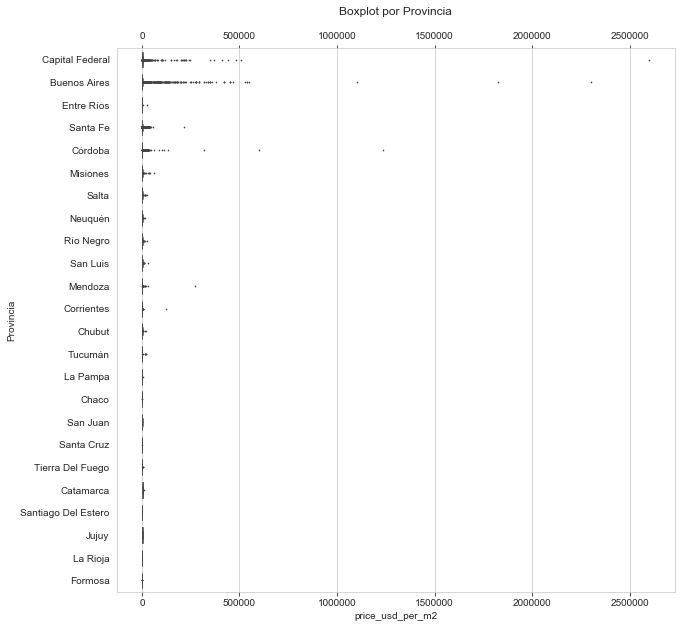

In [21]:
# boxplot POR PROVINCIA  - price_usd_per_m2 -  ANTES

sort_prov = data_clean_ORIGINAL.Provincia.unique()

fig = plt.figure(figsize=(10, 10))
sns.set_style("whitegrid")

ax = plt.title("Boxplot por Provincia", y=1.05) # le doy un pequeño offset el título sino se superpone

ax = sns.boxplot("price_usd_per_m2", "Provincia", data= data_clean_ORIGINAL, order=sort_prov,  width=0.7, whis=1.5, fliersize=0.8, linewidth=0.7)
ax.tick_params(bottom=True, top=True, labelbottom=True, labeltop=True)

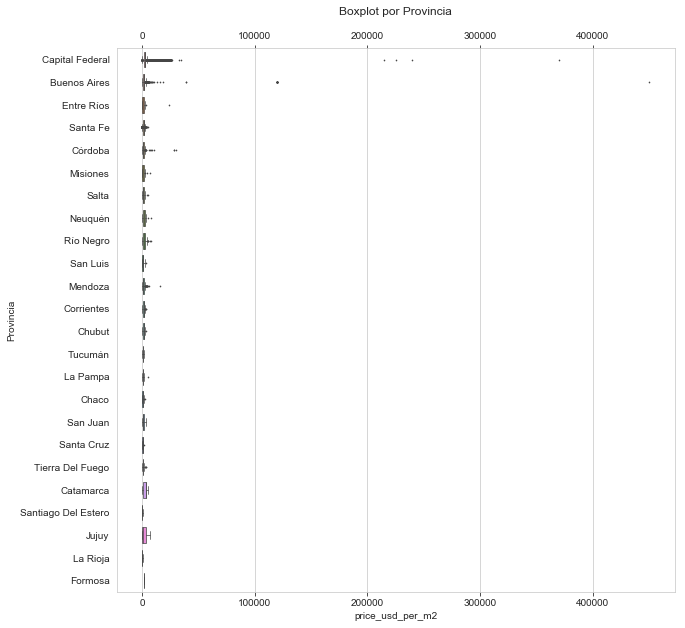

In [22]:
# boxplot POR PROVINCIA - price_usd_per_m2 - LUEGO DE ELIMINAR OUTLIERS

#sort_prov = data_clean.Provincia.unique() # ACÁ VOY A USAR EL MISMO SORT QUE ANTES, PORQUE SINO ME CAMBIA

fig = plt.figure(figsize=(10, 10))
sns.set_style("whitegrid")

ax = plt.title("Boxplot por Provincia", y=1.05) # le doy un pequeño offset el título sino se superpone

ax = sns.boxplot("price_usd_per_m2", "Provincia", data= data_clean, order=sort_prov,  width=0.7, whis=1.5, fliersize=0.8, linewidth=0.7)
ax.tick_params(bottom=True, top=True, labelbottom=True, labeltop=True)

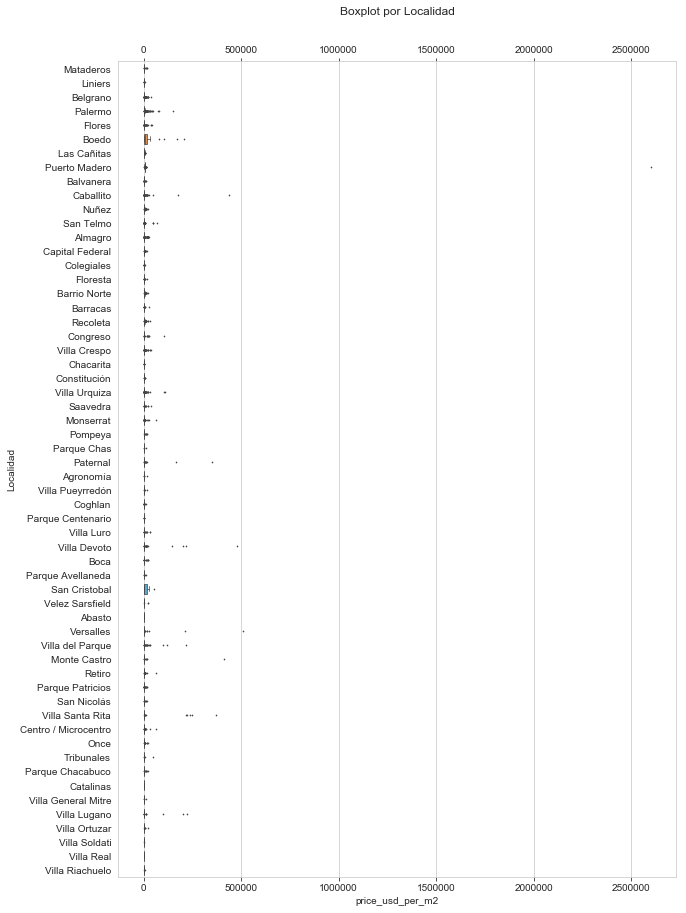

In [23]:
#from pylab import savefig  - price_usd_per_m2 -  ANTES (ejemplo sólo con CABA)

# boxplot POR LOCALIDAD - EJEMPLO: SÓLO CAPITAL FEDERAL
grupos_x_capital= data_clean_ORIGINAL.loc[(data_clean_ORIGINAL["Área"] == "Capital Federal")]

sort_local = grupos_x_capital.Localidad.unique()  

ax = plt.figure(figsize=(10, 15))
sns.set_style("whitegrid")

ax = plt.title("Boxplot por Localidad", y=1.05) # le doy un pequeño offset el título sino se superpone

ax = sns.boxplot("price_usd_per_m2", "Localidad", data= grupos_x_capital, order=sort_local,  width=0.7, whis=1.5, fliersize=0.8, linewidth=0.7)
ax.tick_params(bottom=True, top=True, labelbottom=True, labeltop=True)

ax.figure.savefig("output_antes.png", bbox_inches='tight')


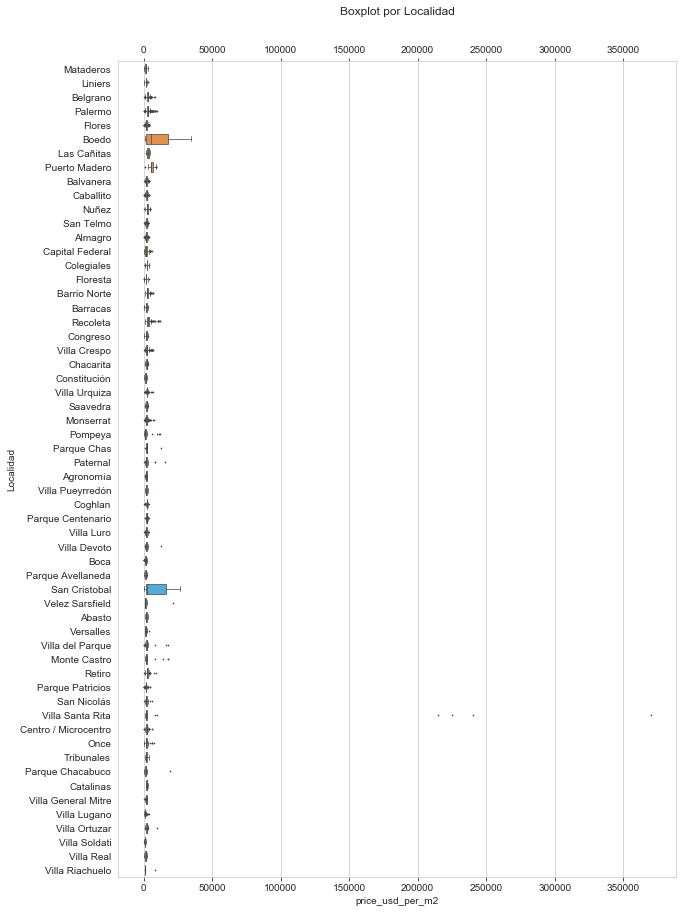

In [24]:
# boxplot POR LOCALIDAD  - price_usd_per_m2 -  LUEGO DE ELIMINAR OUTLIERS (ejemplo sólo con CABA)

grupos_x_capital= data_clean.loc[(data_clean_ORIGINAL["Área"] == "Capital Federal")]

#sort_local = grupos_x_capital.Localidad.unique() # ACÁ VOY A USAR EL MISMO SORT QUE ANTES, PORQUE SINO ME CAMBIA

fig = plt.figure(figsize=(10, 15))
sns.set_style("whitegrid")

ax = plt.title("Boxplot por Localidad", y=1.05) # le doy un pequeño offset el título sino se superpone

ax = sns.boxplot("price_usd_per_m2", "Localidad", data= grupos_x_capital, order=sort_local, width=0.7, whis=1.5, fliersize=0.8, linewidth=0.7)
ax.tick_params(bottom=True, top=True, labelbottom=True, labeltop=True)

ax.figure.savefig("output_depues.png", bbox_inches='tight')

In [25]:
# DEFINIMOS UNA FUNCIÓN QUE ENCUENTRA EL RANGO INTERCUARTIL EN "surface_total_in_m2"
def cuartiles_surface_total_in_m2_localidad(frame_agrupado_localidad):
    q1 = frame_agrupado_localidad["surface_total_in_m2"].quantile(0.25)
    q2 = frame_agrupado_localidad["surface_total_in_m2"].quantile(0.50)
    q3 = frame_agrupado_localidad["surface_total_in_m2"].quantile(0.75)
    q4 = frame_agrupado_localidad["surface_total_in_m2"].quantile(1)
    qi = q3-q1
    qsup = q3 + (qi*1.5)
    qinf = q1 - (qi*1.5)
    qinf, qsup
    
    outlier_mask_up = (frame_agrupado_localidad["surface_total_in_m2"] > qsup)
    outlier_mask_down = (frame_agrupado_localidad["surface_total_in_m2"] < qinf)
    outlier_mask = np.logical_or(outlier_mask_up, outlier_mask_down)
    
    indices_outliers_return = list(frame_agrupado_localidad[outlier_mask].index)
    
    local_qs = (frame_agrupado_localidad["Localidad"].iloc[0], q1, q3)
    
    return indices_outliers_return, local_qs     
    

In [26]:
# DETECCIÓN DE OUTLIERS EN "surface_total_per_m2" utilizando la función antes definida
# SEPARO POR PROVINCIA ("ÁREA") y LUEGO AGRUPO POR ["Localidad", "property_type"] para encontrar outliers

indices_outliers = []
localidades_qs =[]

for area_name in (data_clean["Área"].value_counts().index):
    grupos_x_localidad = data_clean.loc[(data_clean["Área"] == area_name)].groupby(["Localidad", "property_type"])
    for localidad, frame in grupos_x_localidad:
        # HACEMOS LAS OPERACIONES POR LOCALIDAD
        indices_a_eliminar, locali_qs = cuartiles_surface_total_in_m2_localidad(frame)
        indices_outliers.extend(indices_a_eliminar)
        localidades_qs.append(locali_qs)
        #display(frame)

In [27]:
data_clean.shape

(110695, 44)

In [28]:
# ELIMINACIÓN DE OUTLIERS EN "surface_total_in_m2"
data_clean.drop(indices_outliers, axis=0, inplace=True)

In [29]:
data_clean.shape

(104776, 44)

In [30]:
# DEFINIMOS UNA FUNCIÓN QUE ENCUENTRA EL RANGO INTERCUARTIL EN "surface_covered_per_m2"
def cuartiles_surface_covered_in_m2_localidad(frame_agrupado_localidad):
    q1 = frame_agrupado_localidad["surface_covered_in_m2"].quantile(0.25)
    q2 = frame_agrupado_localidad["surface_covered_in_m2"].quantile(0.50)
    q3 = frame_agrupado_localidad["surface_covered_in_m2"].quantile(0.75)
    q4 = frame_agrupado_localidad["surface_covered_in_m2"].quantile(1)
    qi = q3-q1
    qsup = q3 + (qi*1.5)
    qinf = q1 - (qi*1.5)
    qinf, qsup
    
    outlier_mask_up = (frame_agrupado_localidad["surface_covered_in_m2"] > qsup)
    outlier_mask_down = (frame_agrupado_localidad["surface_covered_in_m2"] < qinf)
    outlier_mask = np.logical_or(outlier_mask_up, outlier_mask_down)
    
    indices_outliers_return = list(frame_agrupado_localidad[outlier_mask].index)
    
    local_qs = (frame_agrupado_localidad["Localidad"].iloc[0], q1, q3)
    
    return indices_outliers_return, local_qs     
    

In [31]:
# DETECCIÓN DE OUTLIERS EN "surface_covered_per_m2" utilizando la función antes definida
# SEPARO POR PROVINCIA ("ÁREA") y LUEGO AGRUPO POR ["Localidad", "property_type"] para encontrar outliers

indices_outliers = []
localidades_qs =[]

for area_name in (data_clean["Área"].value_counts().index):
    grupos_x_localidad = data_clean.loc[(data_clean["Área"] == area_name)].groupby(["Localidad", "property_type"])
    for localidad, frame in grupos_x_localidad:
        # HACEMOS LAS OPERACIONES POR LOCALIDAD
        indices_a_eliminar, locali_qs = cuartiles_surface_covered_in_m2_localidad(frame)
        indices_outliers.extend(indices_a_eliminar)
        localidades_qs.append(locali_qs)
        #display(frame)

In [32]:
data_clean.shape

(104776, 44)

In [33]:
# ELIMINACIÓN DE OUTLIERS EN "surface_covered_in_m2"
data_clean.drop(indices_outliers, axis=0, inplace=True)

In [34]:
data_clean.shape

(101993, 44)

<hr id="ToCSV">
<h2 style="color: lightblue">GENERAR CSV FINAL</h2>

In [35]:
data_clean.to_csv("CleanCSV/Clean08_OultiersxZona.csv")